In [65]:
import pandas as pd
import numpy as np

In [66]:
df_AWS = pd.read_csv(
            'https://raw.githubusercontent.com/numenta/NAB/master/data/realKnownCause/ec2_request_latency_system_failure.csv',
                        )
df_TempFail = pd.read_csv(
                'https://raw.githubusercontent.com/numenta/NAB/master/data/realKnownCause/machine_temperature_system_failure.csv',
)
df_AmbTemp = pd.read_csv(
                'https://raw.githubusercontent.com/numenta/NAB/master/data/realKnownCause/ambient_temperature_system_failure.csv',
)
df_CPU = pd.read_csv(
                'https://raw.githubusercontent.com/numenta/NAB/master/data/realKnownCause/cpu_utilization_asg_misconfiguration.csv',
)

In [67]:
df = pd.DataFrame(df_AWS)
df2 = pd.DataFrame(df_TempFail)
df3 = pd.DataFrame(df_AmbTemp)
df4 = pd.DataFrame(df_CPU)

In [68]:
df['timestamp'] = pd.to_datetime(df['timestamp'])
df2['timestamp'] = pd.to_datetime(df2['timestamp'])
df3['timestamp'] = pd.to_datetime(df3['timestamp'])
df4['timestamp'] = pd.to_datetime(df4['timestamp'])

In [69]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

Fig = make_subplots(rows=4, cols=1,
                    subplot_titles=
                    ["Amazon East Coast AWS datacenter CPU usage",
                     'Temperature of an internal component of a large, industrial mahcine',
                     'Ambient temperature in an office',
                     'Amazon Web Services average CPU usage across a given cluster']
                   )

Fig.add_trace(go.Scatter(x=df['timestamp'], 
                        y=df['value'],
                        marker_color='rgb(87, 100, 255)'),
              row=1, col=1,
             )
Fig.add_trace(go.Scatter(x=df2['timestamp'], 
                        y=df2['value'], 
                        marker_color='rgb(87, 100, 255)'),
              row=2, col=1,
             )
Fig.add_trace(go.Scatter(x=df3['timestamp'],
                         y=df3['value'], 
                         marker_color='rgb(87, 100, 255)'),
              row=3, col=1
             )
Fig.add_trace(go.Scatter(x=df4['timestamp'],
                         y=df4['value'], 
                         marker_color='rgb(87, 100, 255)'),
              row=4, col=1
             )

Fig.update_layout(width = 800, height=1000, showlegend=False)

# PCA
For this exercise I will be doing some feature engineering for each data set. Once I have more than the two intial features (value and timestamp), I will then apply PCA to reduce the feature set and identify useful features from dimensionality reduction.

In [70]:
from sklearn import preprocessing
from sklearn.decomposition import PCA

In [71]:
def PCA_2(data):
    min_max_scaler = preprocessing.StandardScaler()
    np_scaled = min_max_scaler.fit_transform(data)
    data = pd.DataFrame(np_scaled)
    # reduce to 2 importants features
    pca = PCA(n_components=2)
    data = pca.fit_transform(data)
    # standardize these 2 new features
    min_max_scaler = preprocessing.StandardScaler()
    np_scaled = min_max_scaler.fit_transform(data)
    data = pd.DataFrame(np_scaled)
    return data

# Kmeans Clustering

In [72]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

In [73]:
def KmeansCluster(data):
    n_cluster = range(1, 20)
    kmeans = [KMeans(n_clusters=i).fit(data) for i in n_cluster]
    scores = [kmeans[i].score(data) for i in range(len(kmeans))]
    return kmeans, scores

In [74]:
def plot_elbow(scores, title):
    n_cluster = range(1,20)
    sns.lineplot(x=n_cluster, y=scores)
    sns.set_style("darkgrid")
    plt.xlabel('Number of Clusters')
    plt.ylabel('Kmeans Score')
    plt.title(str(title) + " Elbow Visual")
    return plt.show()

In [75]:
def assign_clusters(df, data, kmeans, cluster):
    df['Cluster'] = kmeans[cluster].predict(data)
    df['Principal_1'] = data[0]
    df['Principal_2'] = data[1]
    return df

In [76]:
def plotClusters(df, title):
    sns.scatterplot(x='Principal_1',
                    y='Principal_2',
                    data=df,
                    hue='Cluster',
                    palette="deep"
                   )
    plt.xlabel('Principal Feature 1')
    plt.ylabel('Principal Feature 2')
    plt.title(str(title) + ' Visual of the Clusters')
    return plt.show()

In [77]:
# Identify the distance between each point and it's cluster's centroid
def getDistanceByPoint(data, model):
    distance = []
    for i in range(0,len(data)):
        Xa = np.array(data.loc[i])
        Xb = model.cluster_centers_[model.labels_[i]-1]
        distance.append(np.linalg.norm(Xa-Xb))
        
    distance = pd.Series(distance)
    return distance

In [78]:
outliers_fraction = 0.01
# The biggest distances are considered as anomaly
def assignKmeansAnamoly(df, data, kmeans, cluster):
    distance = getDistanceByPoint(data, kmeans[cluster])
    number_of_outliers = int(outliers_fraction*len(distance))
    threshold = distance.nlargest(number_of_outliers).min()
    # anomaly contain the anomaly result of Cluster (0:normal, 1:anomaly) given outlier fraction
    df['Anomaly_Kmeans'] = (distance >= threshold).astype(int)
    return df

In [79]:
def PlotClusterAnomaly(df, title):
    sns.scatterplot(x='Principal_1',
                    y='Principal_2',
                    data=df,hue="Anomaly_Kmeans",
                    palette="deep")
    plt.xlabel('Principal Feature 1')
    plt.ylabel('Principal Feature 2')
    plt.title(str(title) + ' Visual of the Clusters with Anomaly')
    plt.legend([],[], frameon=False)
    return plt.show()

In [80]:
def PlotKmeansAnamoly(df, title):
    a = df.loc[df['Anomaly_Kmeans'] == 1, ['timestamp', 'value']]

    fig, ax = plt.subplots()

    a = df.loc[df['Anomaly_Kmeans'] == 1, ['timestamp', 'value']] #anomaly

    ax.plot(df['timestamp'],
            df['value'],
            color='blue')
    ax.scatter(a['timestamp'],
               a['value'],
               color='red')
    plt.xlabel('Date')
    plt.setp(ax.get_xticklabels(), rotation=45)
    plt.title(str(title) + ' with K-Means Anomaly detection \n (Threhold = 0.001)')
    return plt.show()

# Gaussian with Clusters

In [81]:
from sklearn.covariance import EllipticEnvelope
def GaussianModel(df_class):
    envelope =  EllipticEnvelope(contamination = outliers_fraction) 
    X_train = df_class.values.reshape(-1,1)
    envelope.fit(X_train)
    df_class = pd.DataFrame(df_class)
    df_class['deviation'] = envelope.decision_function(X_train)
    df_class['anomaly'] = envelope.predict(X_train)
    return df_class

In [82]:
def AddGaussAnomaly(df, df_class):
    df['Anomaly_Gaus'] = df_class['anomaly']
    df['Anomaly_Gaus'] = np.array(df['Anomaly_Gaus'] == -1).astype(int)
    return df

In [83]:
def plotGauss(df, title):
    a = df.loc[df['Anomaly_Gaus'] == 1,('timestamp', 'value')] #anomaly
    
    fig, ax = plt.subplots()
    ax.plot(df['timestamp'],
            df['value'],
            color='blue')
    ax.scatter(a['timestamp'],
               a['value'],
               color='red')
    plt.xlabel('Date')
    plt.setp(ax.get_xticklabels(), rotation=45)
    plt.title(str(title) + ' with Gaussian/Cluster detection \n (Threhold = 0.001)')
    return plt.show()

# Isolation Forest

In [84]:
from sklearn.ensemble import IsolationForest
# Take useful feature and standardize them 
def isolationForest(df, data):
    min_max_scaler = preprocessing.StandardScaler()
    np_scaled = min_max_scaler.fit_transform(data)
    data = pd.DataFrame(np_scaled)
    # train isolation forest 
    model =  IsolationForest(contamination = outliers_fraction)
    model.fit(data)
    # add the data to the main  
    df['Anomaly_IF'] = pd.Series(model.predict(data))
    df['Anomaly_IF'] = df['Anomaly_IF'].map( {1: 0, -1: 1} )
    return df

In [85]:
def plotIsolationForest(df, title):
    fig, ax = plt.subplots()

    a = df.loc[df['Anomaly_IF'] == 1, ['timestamp', 'value']] #anomaly

    ax.plot(df['timestamp'], df['value'], color='blue')
    ax.scatter(a['timestamp'],a['value'], color='red')
    plt.xlabel('Date')
    plt.setp(ax.get_xticklabels(), rotation=45)
    plt.title(str(title) + ' with Isolation Forest detection \n (Threhold = 0.001)')
    return plt.show()

# One Class SVM

In [86]:
from sklearn.svm import OneClassSVM

outliers_fraction = 0.001

def SVM(df, data):
    min_max_scaler = preprocessing.StandardScaler()
    np_scaled = min_max_scaler.fit_transform(data)
    # train one class SVM 
    model =  OneClassSVM(nu=0.95 * outliers_fraction) #nu=0.95 * outliers_fraction  + 0.05
    data = pd.DataFrame(np_scaled)
    model.fit(data)
    # add the data to the main  
    df['Anomaly_SVM'] = pd.Series(model.predict(data))
    df['Anomaly_SVM'] = df['Anomaly_SVM'].map( {1: 0, -1: 1} )
    return df

In [87]:
def plotSVM(df, title):
    fig, ax = plt.subplots()

    a = df.loc[df['Anomaly_SVM'] == 1, ['timestamp', 'value']] #anomaly

    ax.plot(df['timestamp'], df['value'], color='blue')
    ax.scatter(a['timestamp'],a['value'], color='red')
    plt.xlabel('Date')
    plt.setp(ax.get_xticklabels(), rotation=45)
    plt.title(str(title) + ' with SVM detection \n (Threhold = 0.001)')
    plt.show()

# Amazon East Coast AWS datacenter CPU usage
CPU usage data from a server in Amazon's East Coast datacenter. The dataset ends with complete system failure resulting from a documented failure of AWS API servers. 

## Kmeans Clustering

In [137]:
df['hours'] = df['timestamp'].dt.hour
df['Day'] = df['timestamp'].dt.dayofweek
df['min'] = df['timestamp'].dt.minute

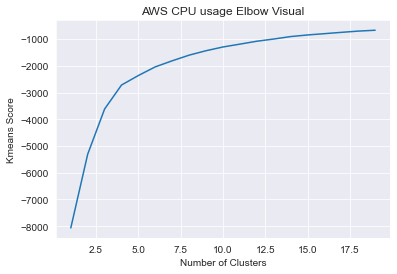

In [138]:
data = df[['value', 'hours', 'Day', 'min']]
data = PCA_2(data)
kmeans, scores = KmeansCluster(data)
plot_elbow(scores, title = 'AWS CPU usage')

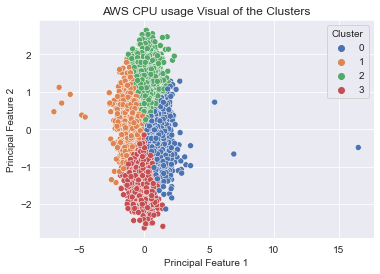

In [139]:
cluster = 3
df = assign_clusters(df, data, kmeans, cluster)
plotClusters(df, title = 'AWS CPU usage')

In [140]:
df = assignKmeansAnamoly(df, data, kmeans, cluster)

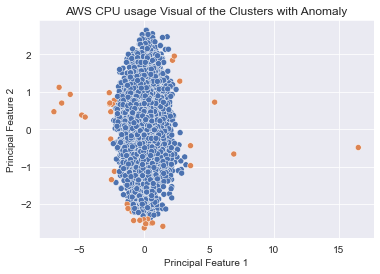

In [141]:
PlotClusterAnomaly(df, title = 'AWS CPU usage')

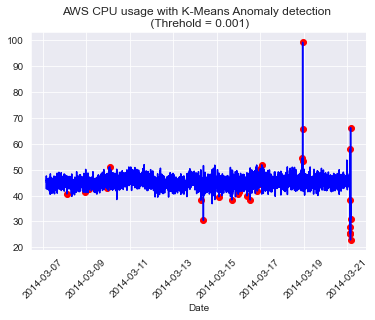

In [142]:
PlotKmeansAnamoly(df, title = 'AWS CPU usage')

### Gaussian with Clusters

In [143]:
df_class0 = df.loc[df['Cluster'] == 0, 'value']
df_class1 = df.loc[df['Cluster'] == 1, 'value']
df_class2 = df.loc[df['Cluster'] == 2, 'value']
df_class3 = df.loc[df['Cluster'] == 3, 'value']

In [144]:
df_class0 = GaussianModel(df_class0)
df_class1 = GaussianModel(df_class1)
df_class2 = GaussianModel(df_class2)
df_class3 = GaussianModel(df_class3)

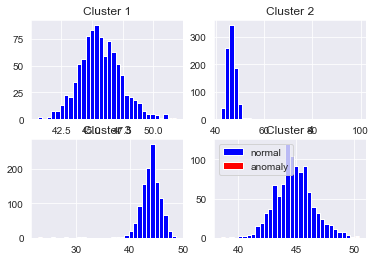

In [96]:
# plot the temperature repartition by categories with anomalies
a0 = df_class0.loc[df_class0['anomaly'] == 1, 'value']
b0 = df_class0.loc[df_class0['anomaly'] == -1, 'value']

a1 = df_class1.loc[df_class1['anomaly'] == 1, 'value']
b1 = df_class1.loc[df_class1['anomaly'] == -1, 'value']

a2 = df_class2.loc[df_class2['anomaly'] == 1, 'value']
b2 = df_class2.loc[df_class2['anomaly'] == -1, 'value']

a3 = df_class3.loc[df_class3['anomaly'] == 1, 'value']
b3 = df_class3.loc[df_class3['anomaly'] == -1, 'value']

fig, axs = plt.subplots(2,2)
axs[0,0].hist([a0,b0], bins=32, stacked=True, color=['blue', 'red'], label=['normal', 'anomaly'])
axs[0,1].hist([a1,b1], bins=32, stacked=True, color=['blue', 'red'], label=['normal', 'anomaly'])
axs[1,0].hist([a2,b2], bins=32, stacked=True, color=['blue', 'red'], label=['normal', 'anomaly'])
axs[1,1].hist([a3,b3], bins=32, stacked=True, color=['blue', 'red'], label=['normal', 'anomaly'])
axs[0,0].set_title("Cluster 1")
axs[0,1].set_title("Cluster 2")
axs[1,0].set_title("Cluster 3")
axs[1,1].set_title("Cluster 4")
plt.legend()
plt.show()

In [145]:
# add the data to the main 
df_class = pd.concat([df_class0, df_class1, df_class2, df_class3])
df = AddGaussAnomaly(df, df_class)

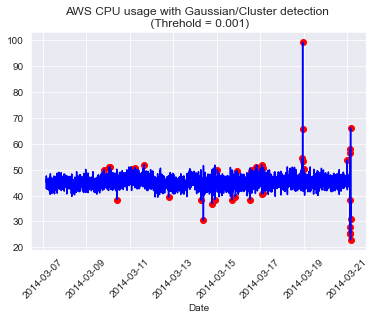

In [146]:
title = 'AWS CPU usage'
plotGauss(df, title)

### Isolation Forest

In [147]:
data = df[['value', 'hours', 'Day', 'min']]

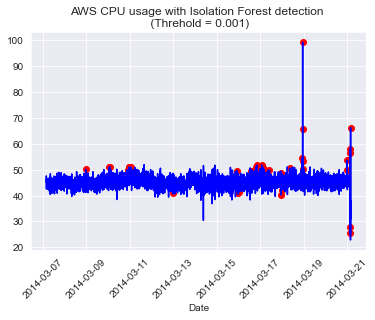

In [148]:
df = isolationForest(df, data)
title = 'AWS CPU usage'
plotIsolationForest(df, title)

### One Class SVM

In [149]:
data = df[['value', 'hours', 'Day', 'min']]
df = SVM(df, data)

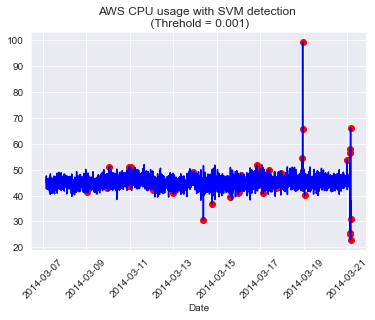

In [150]:
title = 'AWS CPU usage'
plotSVM(df, title)

### LSTM RNN

In [151]:
#select and standardize data
data_n = df[['value', 'hours', 'Day', 'min']]
min_max_scaler = preprocessing.StandardScaler()
np_scaled = min_max_scaler.fit_transform(data_n)
data_n = pd.DataFrame(np_scaled)

# important parameters and train/test size
prediction_time = 1 
testdatasize = int(len(df['value'])*.3)
unroll_length = 50
testdatacut = testdatasize + unroll_length  + 1

#train data
x_train = data_n[0:-prediction_time-testdatacut]
y_train = data_n[prediction_time:-testdatacut ][0]

# test data
x_test = data_n[0-testdatacut:-prediction_time]
y_test = data_n[prediction_time-testdatacut:  ][0]

In [152]:
def unroll(data,sequence_length=24):
    result = []
    for index in range(len(data) - sequence_length):
        result.append(data[index: index + sequence_length])
    return np.asarray(result)

# adapt the datasets for the sequence data shape
x_train = unroll(x_train,unroll_length)
x_test  = unroll(x_test,unroll_length)
y_train = y_train[-x_train.shape[0]:]
y_test  = y_test[-x_test.shape[0]:]

In [153]:
print('X Train shape: ', x_train.shape)
print('Y Train shape: ', y_train.shape)
print('X Test shape: ', x_test.shape)
print('Y Test shape: ', y_test.shape)

X Train shape:  (2930, 50, 4)
Y Train shape:  (2930,)
X Test shape:  (1000, 50, 4)
Y Test shape:  (1000,)


In [154]:
input_shape = (x_train.shape[1], x_train.shape[2])
input_shape

(50, 4)

In [155]:
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.layers import LSTM
from tensorflow.keras.models import Sequential
import time #helper libraries
from keras.models import model_from_json
import sys

model = Sequential()

model.add(LSTM(units = 100, return_sequences = True, input_shape = input_shape))
model.add(Dropout(0.2))
model.add(LSTM(units = 100, return_sequences = True))
model.add(Dropout(0.2))
model.add(LSTM(units = 100, return_sequences = False))
model.add(Dropout(0.2))
model.add(Dense(units = 1))
model.add(Activation('linear'))

start = time.time()
model.compile(loss='mse', optimizer='adam')
print('compilation time : {}'.format(time.time() - start))

compilation time : 0.004988670349121094


In [156]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3 (LSTM)                (None, 50, 100)           42000     
_________________________________________________________________
dropout_3 (Dropout)          (None, 50, 100)           0         
_________________________________________________________________
lstm_4 (LSTM)                (None, 50, 100)           80400     
_________________________________________________________________
dropout_4 (Dropout)          (None, 50, 100)           0         
_________________________________________________________________
lstm_5 (LSTM)                (None, 100)               80400     
_________________________________________________________________
dropout_5 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                

In [157]:
model.fit(
    x_train,
    y_train,
    batch_size=64,
    epochs=15,
)

Epoch 1/15
46/46 [==============================] - 10s 96ms/step - loss: 0.7129
Epoch 2/15
46/46 [==============================] - 5s 98ms/step - loss: 0.6173: 1s - 
Epoch 3/15
46/46 [==============================] - 4s 94ms/step - loss: 0.6289
Epoch 4/15
46/46 [==============================] - 5s 100ms/step - loss: 0.6307
Epoch 5/15
46/46 [==============================] - 5s 102ms/step - loss: 0.6148
Epoch 6/15
46/46 [==============================] - 5s 107ms/step - loss: 0.6232
Epoch 7/15
46/46 [==============================] - 5s 107ms/step - loss: 0.5886
Epoch 8/15
46/46 [==============================] - 5s 106ms/step - loss: 0.6370
Epoch 9/15
46/46 [==============================] - 5s 102ms/step - loss: 0.6302
Epoch 10/15
46/46 [==============================] - 5s 101ms/step - loss: 0.6174
Epoch 11/15
46/46 [==============================] - 5s 108ms/step - loss: 0.6599
Epoch 12/15
46/46 [==============================] - 5s 101ms/step - loss: 0.6420
Epoch 13/15
46/46 [=

In [158]:
y_test = y_test.reset_index().drop(columns=['index'])

In [159]:
# create the list of difference between prediction and test data
diff=[]
ratio=[]
p = model.predict(x_test)
prediction = []

for u in range(len(y_test)):
    pr = p[u][0]
    prediction.append(pr)
    actual = y_test[0][u]
    ratio.append((actual / pr ) - 1)
    diff.append(abs(actual - pr))

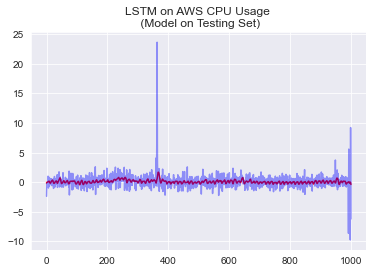

In [160]:
# plot the prediction and the reality (for the test data)
fig, axs = plt.subplots()
axs.plot(p,color='red', label='prediction')
axs.plot(y_test,color='blue', label='y_test', alpha=0.4)
axs.legend().set_visible(False)
plt.title('LSTM on AWS CPU Usage \n (Model on Testing Set)')
plt.show()

In [163]:
# select the most distant prediction/reality data points as anomalies
diff = pd.Series(diff)
outliers_fraction = 0.01
number_of_outliers = int(outliers_fraction*len(diff))
threshold = diff.nlargest(number_of_outliers).min()
# data with anomaly label (test data part)
test = (diff >= threshold).astype(int)
# the training data part where we didn't predict anything (overfitting possible): no anomaly
complement = pd.Series(0, index=np.arange(len(data_n)-testdatasize))
# # add the data to the main
df['anomaly27'] = complement.append(test, ignore_index='True')
print(df['anomaly27'].value_counts())

0    4022
1      10
Name: anomaly27, dtype: int64


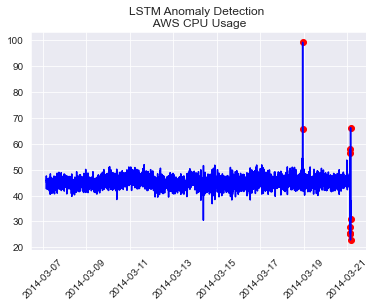

In [164]:
fig, ax = plt.subplots()

a = df.loc[df['anomaly27'] == 1, ['timestamp', 'value']] #anomaly

ax.plot(df['timestamp'], df['value'], color='blue')
ax.scatter(a['timestamp'],a['value'], color='red')
plt.title('LSTM Anomaly Detection \n AWS CPU Usage')
plt.setp(ax.get_xticklabels(), rotation=45)
plt.show()

# Temperature of an internal component of a large, industrial mahcine
Temperature sensor data of an internal component of a large, industrial mahcine. The first anomaly is a planned shutdown of the machine. The second anomaly is difficult to detect and directly led to the third anomaly, a catastrophic failure of the machine.

In [165]:
df2['hours'] = df2['timestamp'].dt.hour
df2['Day'] = df2['timestamp'].dt.dayofweek

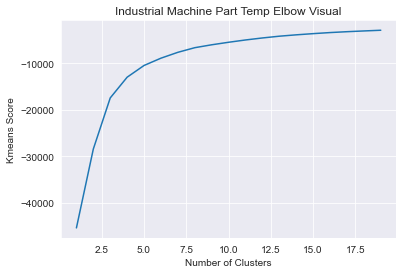

In [427]:
data = df2[['value', 'hours', 'Day']]
data = PCA_2(data)
kmeans, scores = KmeansCluster(data)
plot_elbow(scores, title = "Industrial Machine Part Temp")

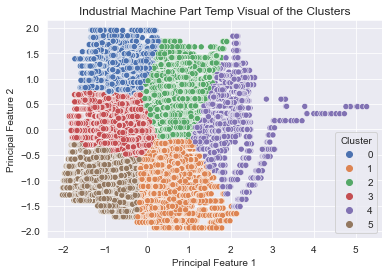

In [428]:
cluster = 5
df2 = assign_clusters(df2, data, kmeans, cluster)
plotClusters(df2, title = "Industrial Machine Part Temp")

In [429]:
df2 = assignKmeansAnamoly(df2, data, kmeans, cluster)

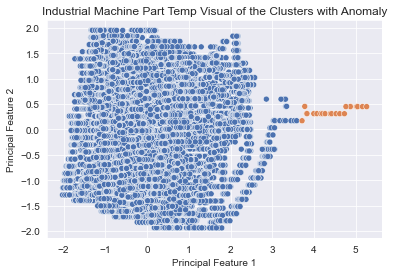

In [430]:
PlotClusterAnomaly(df2, title = "Industrial Machine Part Temp")

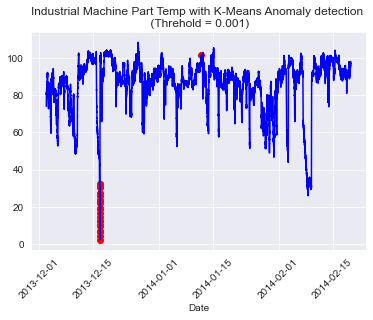

In [431]:
PlotKmeansAnamoly(df2, title = "Industrial Machine Part Temp")

### Gaussian with Clusters

In [343]:
df_class0 = df2.loc[df2['Cluster'] == 0, 'value']
df_class1 = df2.loc[df2['Cluster'] == 1, 'value']
df_class2 = df2.loc[df2['Cluster'] == 2, 'value']
df_class3 = df2.loc[df2['Cluster'] == 3, 'value']
df_class4 = df2.loc[df2['Cluster'] == 4, 'value']
df_class5 = df2.loc[df2['Cluster'] == 5, 'value']


In [344]:
df_class0 = GaussianModel(df_class0)
df_class1 = GaussianModel(df_class1)
df_class2 = GaussianModel(df_class2)
df_class3 = GaussianModel(df_class3)
df_class4 = GaussianModel(df_class4)
df_class5 = GaussianModel(df_class5)

In [345]:
# add the data to the main 
df_class = pd.concat([df_class0, df_class1, df_class2, df_class3, df_class4, df_class5])
df2 = AddGaussAnomaly(df2, df_class)

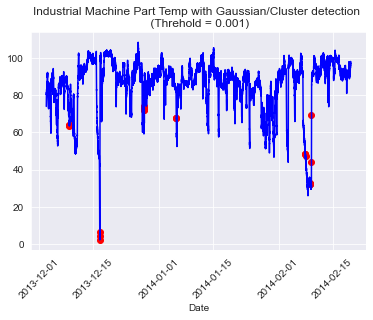

In [347]:
plotGauss(df2, title = "Industrial Machine Part Temp")

### Isolation Forest

In [348]:
data = df2[['value', 'hours', 'Day']]

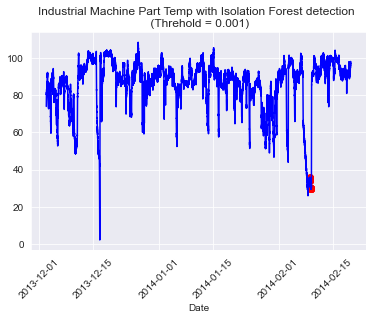

In [349]:
df2 = isolationForest(df2, data)
plotIsolationForest(df2, title = "Industrial Machine Part Temp")

### One Class SVM

In [350]:
data = df2[['value', 'hours', 'Day']]
df2 = SVM(df2, data)

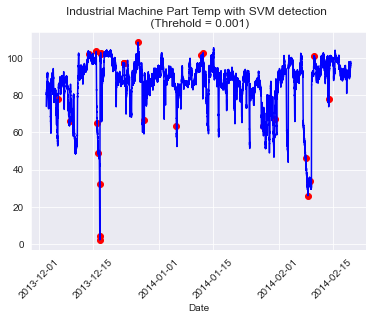

In [352]:
plotSVM(df2, title = "Industrial Machine Part Temp")

### LSTM RNN

In [166]:
#select and standardize data
data_n = df2[['value', 'hours', 'Day']]
min_max_scaler = preprocessing.StandardScaler()
np_scaled = min_max_scaler.fit_transform(data_n)
data_n = pd.DataFrame(np_scaled)

# important parameters and train/test size
prediction_time = 1 
testdatasize = int(len(df2['value'])*.3)
unroll_length = 50
testdatacut = testdatasize + unroll_length  + 1

#train data
x_train = data_n[0:-prediction_time-testdatacut]
y_train = data_n[prediction_time:-testdatacut ][0]

# test data
x_test = data_n[0-testdatacut:-prediction_time]
y_test = data_n[prediction_time-testdatacut:  ][0]

In [167]:
def unroll(data,sequence_length=24):
    result = []
    for index in range(len(data) - sequence_length):
        result.append(data[index: index + sequence_length])
    return np.asarray(result)

# adapt the datasets for the sequence data shape
x_train = unroll(x_train,unroll_length)
x_test  = unroll(x_test,unroll_length)
y_train = y_train[-x_train.shape[0]:]
y_test  = y_test[-x_test.shape[0]:]

In [168]:
print('X Train shape: ', x_train.shape)
print('Y Train shape: ', y_train.shape)
print('X Test shape: ', x_test.shape)
print('Y Test shape: ', y_test.shape)

X Train shape:  (21593, 50, 3)
Y Train shape:  (21593,)
X Test shape:  (1000, 50, 3)
Y Test shape:  (1000,)


In [169]:
input_shape = (x_train.shape[1], x_train.shape[2])
input_shape

(50, 3)

In [170]:
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.layers import LSTM
from tensorflow.keras.models import Sequential
import time #helper libraries
from keras.models import model_from_json
import sys

model = Sequential()

model.add(LSTM(units = 100, return_sequences = True, input_shape = input_shape))
model.add(Dropout(0.2))
model.add(LSTM(units = 100, return_sequences = True))
model.add(Dropout(0.2))
model.add(LSTM(units = 100, return_sequences = False))
model.add(Dropout(0.2))
model.add(Dense(units = 1))
model.add(Activation('linear'))

start = time.time()
model.compile(loss='mse', optimizer='adam')
print('compilation time : {}'.format(time.time() - start))

compilation time : 0.004987001419067383


In [171]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_6 (LSTM)                (None, 50, 100)           41600     
_________________________________________________________________
dropout_6 (Dropout)          (None, 50, 100)           0         
_________________________________________________________________
lstm_7 (LSTM)                (None, 50, 100)           80400     
_________________________________________________________________
dropout_7 (Dropout)          (None, 50, 100)           0         
_________________________________________________________________
lstm_8 (LSTM)                (None, 100)               80400     
_________________________________________________________________
dropout_8 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                

In [172]:
model.fit(
    x_train,
    y_train,
    batch_size=64,
    epochs=15,
)

Epoch 1/15
338/338 [==============================] - 39s 102ms/step - loss: 0.1032
Epoch 2/15
338/338 [==============================] - 34s 100ms/step - loss: 0.0262
Epoch 3/15
338/338 [==============================] - 35s 104ms/step - loss: 0.0214
Epoch 4/15
338/338 [==============================] - 34s 101ms/step - loss: 0.0193
Epoch 5/15
338/338 [==============================] - 34s 101ms/step - loss: 0.0180
Epoch 6/15
338/338 [==============================] - 34s 101ms/step - loss: 0.0155
Epoch 7/15
338/338 [==============================] - 34s 101ms/step - loss: 0.0139
Epoch 8/15
338/338 [==============================] - 34s 102ms/step - loss: 0.0143
Epoch 9/15
338/338 [==============================] - 34s 101ms/step - loss: 0.0144
Epoch 10/15
338/338 [==============================] - 34s 101ms/step - loss: 0.0146
Epoch 11/15
338/338 [==============================] - 34s 101ms/step - loss: 0.0149
Epoch 12/15
338/338 [==============================] - 34s 101ms/step - lo

In [173]:
y_test = y_test.reset_index().drop(columns=['index'])

In [174]:
# create the list of difference between prediction and test data
diff=[]
ratio=[]
p = model.predict(x_test)
prediction = []

for u in range(len(y_test)):
    pr = p[u][0]
    prediction.append(pr)
    actual = y_test[0][u]
    ratio.append((actual / pr ) - 1)
    diff.append(abs(actual - pr))

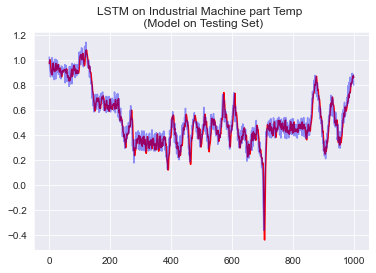

In [175]:
# plot the prediction and the reality (for the test data)
fig, axs = plt.subplots()
axs.plot(p,color='red', label='prediction')
axs.plot(y_test,color='blue', label='y_test', alpha=0.4)
axs.legend().set_visible(False)
plt.title('LSTM on Industrial Machine part Temp \n (Model on Testing Set)')
plt.show()

In [180]:
# select the most distant prediction/reality data points as anomalies
diff = pd.Series(diff)
outliers_fraction = 0.01
number_of_outliers = int(outliers_fraction*len(diff))
threshold = diff.nlargest(number_of_outliers).min()
# data with anomaly label (test data part)
test = (diff >= threshold).astype(int)
# the training data part where we didn't predict anything (overfitting possible): no anomaly
complement = pd.Series(0, index=np.arange(len(data_n)-testdatasize))
# # add the data to the main
df2['anomaly27'] = complement.append(test, ignore_index='True')
print(df2['anomaly27'].value_counts())

0    22685
1       10
Name: anomaly27, dtype: int64


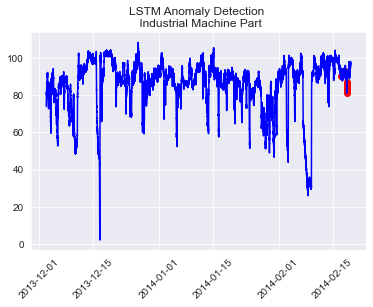

In [181]:
fig, ax = plt.subplots()

a = df2.loc[df2['anomaly27'] == 1, ['timestamp', 'value']] #anomaly

ax.plot(df2['timestamp'], df2['value'], color='blue')
ax.scatter(a['timestamp'],a['value'], color='red')
plt.title('LSTM Anomaly Detection \n Industrial Machine Part')
plt.setp(ax.get_xticklabels(), rotation=45)
plt.show()

# Ambient temperature in an office
The ambient temperature in an office setting.

**Feature engineering**

Useful information about an office space would be day of the week and whether there is anyone in the office (working hours).
We can extract those features from the date/time column and create new columns with this data.

In [182]:
df3['hours'] = df3['timestamp'].dt.hour
df3['WorkHours'] = ((df3['hours'] >= 7) & (df3['hours'] <= 20)).astype(int)
df3['Day'] = df3['timestamp'].dt.dayofweek
df3['WeekDay'] = (df3['Day'] < 5).astype(int)

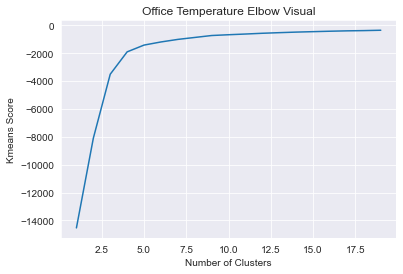

In [414]:
data = df3[['value', 'hours', 'WorkHours', 'Day', 'WeekDay']]
data = PCA_2(data)
kmeans, scores = KmeansCluster(data)
plot_elbow(scores, title = "Office Temperature")

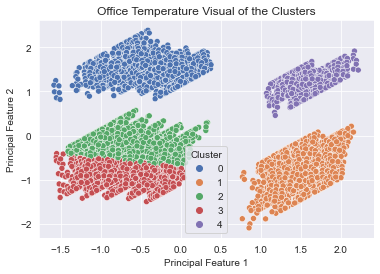

In [415]:
cluster = 4
df3 = assign_clusters(df3, data, kmeans, cluster)
plotClusters(df3, title = "Office Temperature")

In [416]:
df3 = assignKmeansAnamoly(df3, data, kmeans, cluster)

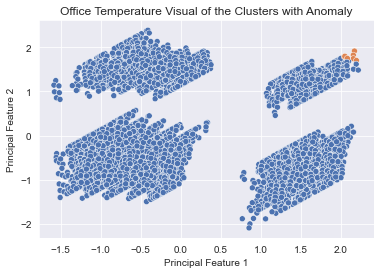

In [417]:
PlotClusterAnomaly(df3, title = "Office Temperature")

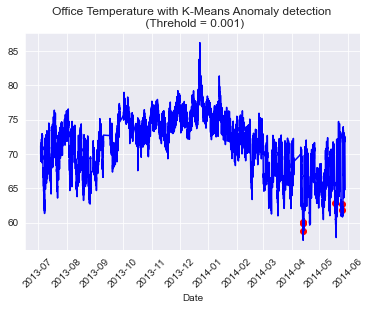

In [418]:
PlotKmeansAnamoly(df3, title = "Office Temperature")

In [ ]:
Working = df3[(df3['WorkHours'] == 1) & (df3['WeekDay'] == 1)]
NotWorking = df3[(df3['WorkHours'] == 0) | (df3['WeekDay'] == 0)]

In [ ]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
a_heights, a_bins = np.histogram(Working['value'])
b_heights, b_bins = np.histogram(NotWorking['value'], bins=a_bins)
width = (a_bins[1] - a_bins[0])/2.5

ax.bar(a_bins[:-1], 
       a_heights*100/Working['value'].count(),
       width=width,
       facecolor='blue',
       label='Working Hours')
ax.bar(b_bins[:-1]+width,
       (b_heights*100/NotWorking['value'].count()),
       width=width,
       facecolor='green',
       label ='Non Working Hours')
plt.legend()
plt.show()

### Gaussian with Clusters

In [359]:
df_class0 = df3.loc[df3['Cluster'] == 0, 'value']
df_class1 = df3.loc[df3['Cluster'] == 1, 'value']
df_class2 = df3.loc[df3['Cluster'] == 2, 'value']
df_class3 = df3.loc[df3['Cluster'] == 3, 'value']
df_class4 = df3.loc[df3['Cluster'] == 4, 'value']

In [360]:
df_class0 = GaussianModel(df_class0)
df_class1 = GaussianModel(df_class1)
df_class2 = GaussianModel(df_class2)
df_class3 = GaussianModel(df_class3)
df_class4 = GaussianModel(df_class4)

In [361]:
# add the data to the main 
df_class = pd.concat([df_class0, df_class1, df_class2, df_class3, df_class4])
df3 = AddGaussAnomaly(df3, df_class)

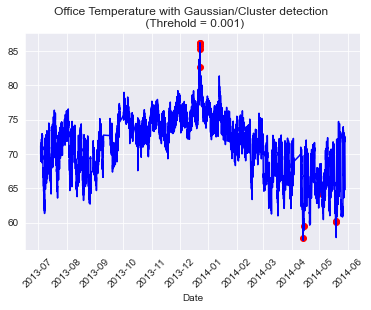

In [362]:
plotGauss(df3, title = "Office Temperature")

### Isolation Forest

In [363]:
data = df3[['value', 'hours', 'WorkHours', 'Day', 'WeekDay']]

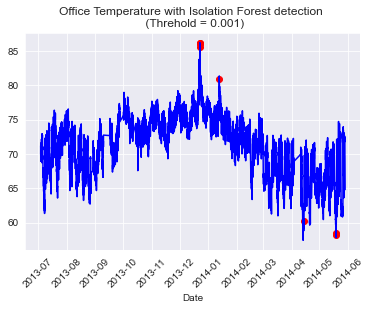

In [364]:
df3 = isolationForest(df3, data)
plotIsolationForest(df3, title = "Office Temperature")

### One Class SVM

In [365]:
data = df3[['value', 'hours', 'WorkHours', 'Day', 'WeekDay']]
df3 = SVM(df3, data)

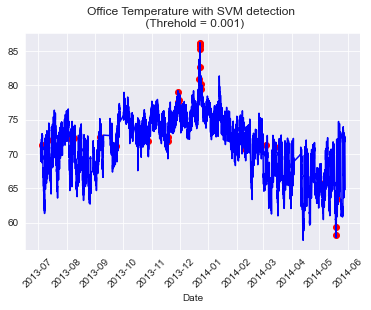

In [366]:
plotSVM(df3, title = "Office Temperature")

### LSTM RNN

In [187]:
#select and standardize data
data_n = df3[['value', 'hours', 'WorkHours', 'Day', 'WeekDay']]
min_max_scaler = preprocessing.StandardScaler()
np_scaled = min_max_scaler.fit_transform(data_n)
data_n = pd.DataFrame(np_scaled)

# important parameters and train/test size
prediction_time = 1 
testdatasize = int(len(df3['value'])*.3)
unroll_length = 50
testdatacut = testdatasize + unroll_length  + 1

#train data
x_train = data_n[0:-prediction_time-testdatacut]
y_train = data_n[prediction_time:-testdatacut ][0]

# test data
x_test = data_n[0-testdatacut:-prediction_time]
y_test = data_n[prediction_time-testdatacut:  ][0]

In [188]:
def unroll(data,sequence_length=24):
    result = []
    for index in range(len(data) - sequence_length):
        result.append(data[index: index + sequence_length])
    return np.asarray(result)

# adapt the datasets for the sequence data shape
x_train = unroll(x_train,unroll_length)
x_test  = unroll(x_test,unroll_length)
y_train = y_train[-x_train.shape[0]:]
y_test  = y_test[-x_test.shape[0]:]

In [189]:
print('X Train shape: ', x_train.shape)
print('Y Train shape: ', y_train.shape)
print('X Test shape: ', x_test.shape)
print('Y Test shape: ', y_test.shape)

X Train shape:  (4985, 50, 5)
Y Train shape:  (4985,)
X Test shape:  (2180, 50, 5)
Y Test shape:  (2180,)


In [190]:
input_shape = (x_train.shape[1], x_train.shape[2])
input_shape

(50, 5)

In [191]:
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.layers import LSTM
from tensorflow.keras.models import Sequential
import time #helper libraries
from keras.models import model_from_json
import sys

model = Sequential()

model.add(LSTM(units = 100, return_sequences = True, input_shape = input_shape))
model.add(Dropout(0.2))
model.add(LSTM(units = 100, return_sequences = True))
model.add(Dropout(0.2))
model.add(LSTM(units = 100, return_sequences = False))
model.add(Dropout(0.2))
model.add(Dense(units = 1))
model.add(Activation('linear'))

start = time.time()
model.compile(loss='mse', optimizer='adam')
print('compilation time : {}'.format(time.time() - start))

compilation time : 0.006981849670410156


In [192]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_9 (LSTM)                (None, 50, 100)           42400     
_________________________________________________________________
dropout_9 (Dropout)          (None, 50, 100)           0         
_________________________________________________________________
lstm_10 (LSTM)               (None, 50, 100)           80400     
_________________________________________________________________
dropout_10 (Dropout)         (None, 50, 100)           0         
_________________________________________________________________
lstm_11 (LSTM)               (None, 100)               80400     
_________________________________________________________________
dropout_11 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                

In [193]:
model.fit(
    x_train,
    y_train,
    batch_size=64,
    epochs=15,
)

Epoch 1/15
78/78 [==============================] - 96s 103ms/step - loss: 0.1993
Epoch 2/15
78/78 [==============================] - 9s 113ms/step - loss: 0.0629
Epoch 3/15
78/78 [==============================] - 8s 107ms/step - loss: 0.0592
Epoch 4/15
78/78 [==============================] - 8s 107ms/step - loss: 0.0555
Epoch 5/15
78/78 [==============================] - 8s 105ms/step - loss: 0.0562
Epoch 6/15
78/78 [==============================] - 8s 107ms/step - loss: 0.0479
Epoch 7/15
78/78 [==============================] - 8s 105ms/step - loss: 0.0499
Epoch 8/15
78/78 [==============================] - 8s 107ms/step - loss: 0.0481
Epoch 9/15
78/78 [==============================] - 8s 105ms/step - loss: 0.0459
Epoch 10/15
78/78 [==============================] - 9s 113ms/step - loss: 0.0463
Epoch 11/15
78/78 [==============================] - 8s 104ms/step - loss: 0.0439
Epoch 12/15
78/78 [==============================] - 8s 109ms/step - loss: 0.0452
Epoch 13/15
78/78 [=====

In [195]:
p = model.predict(x_test)

In [198]:
y_test = y_test.reset_index().drop(columns=['index'])

In [205]:
y_test[0][0]

0.22875578417364123

In [206]:
# create the list of difference between prediction and test data
diff=[]
ratio=[]
p = model.predict(x_test)

for u in range(len(y_test)):
    pr = p[u][0]
    actual = y_test[0][u]
    ratio.append((actual / pr ) - 1)
    diff.append(abs(actual - pr))

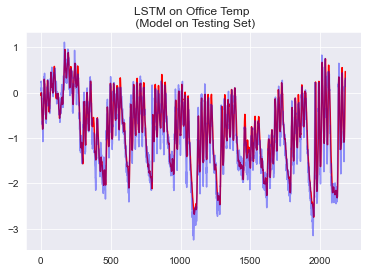

In [210]:
# plot the prediction and the reality (for the test data)
fig, axs = plt.subplots()
axs.plot(p,color='red', label='prediction')
axs.plot(y_test,color='blue', label='y_test', alpha = 0.4)
axs.legend().set_visible(False)
plt.title('LSTM on Office Temp \n (Model on Testing Set)')
plt.show()

In [214]:
# select the most distant prediction/reality data points as anomalies
outliers_fraction = 0.01
diff = pd.Series(diff)
number_of_outliers = int(outliers_fraction*len(diff))
threshold = diff.nlargest(number_of_outliers).min()
# data with anomaly label (test data part)
test = (diff >= threshold).astype(int)
# the training data part where we didn't predict anything (overfitting possible): no anomaly
complement = pd.Series(0, index=np.arange(len(data_n)-testdatasize))
# # add the data to the main
df3['anomaly27'] = complement.append(test, ignore_index='True')
print(df3['anomaly27'].value_counts())

0    7246
1      21
Name: anomaly27, dtype: int64


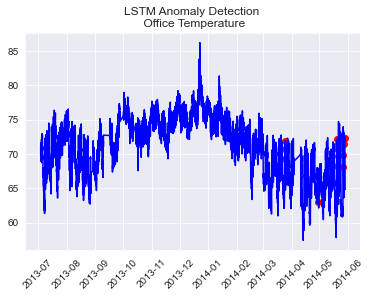

In [215]:
fig, ax = plt.subplots()

a = df3.loc[df3['anomaly27'] == 1, ['timestamp', 'value']] #anomaly

ax.plot(df3['timestamp'], df3['value'], color='blue')
ax.scatter(a['timestamp'],a['value'], color='red')
plt.title('LSTM Anomaly Detection \n Office Temperature')
plt.setp(ax.get_xticklabels(), rotation=45)
plt.show()

# Amazon Web Services average CPU usage across a given cluster
From Amazon Web Services (AWS) monitoring CPU usage – i.e. average CPU usage across a given cluster. When usage is high, AWS spins up a new machine, and uses fewer machines when usage is low.

In [216]:
df4['hours'] = df4['timestamp'].dt.hour
df4['Day'] = df4['timestamp'].dt.dayofweek
df4['WeekDay'] = (df4['Day'] < 5).astype(int)

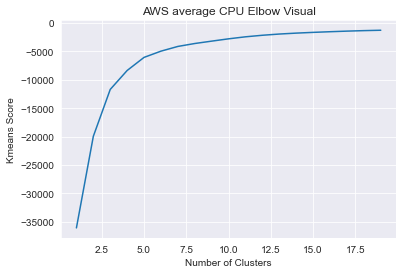

In [420]:
data = df4[['value', 'hours', 'Day', 'WeekDay']]
data = PCA_2(data)
kmeans, scores = KmeansCluster(data)
plot_elbow(scores, title = "AWS average CPU")

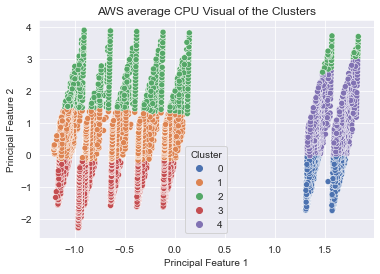

In [421]:
cluster = 4
df4 = assign_clusters(df4, data, kmeans, cluster)
plotClusters(df4, title = "AWS average CPU")

In [422]:
df4 = assignKmeansAnamoly(df4, data, kmeans, cluster)

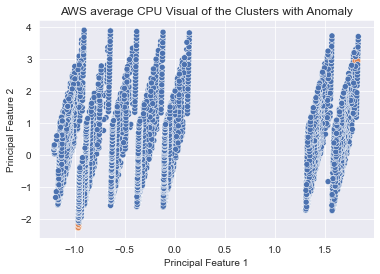

In [423]:
PlotClusterAnomaly(df4, title = "AWS average CPU")

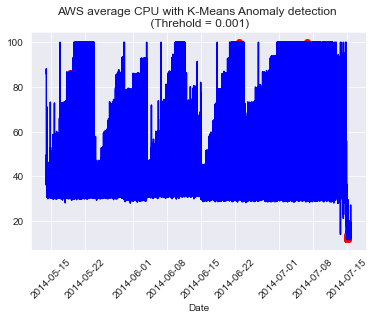

In [424]:
PlotKmeansAnamoly(df4, title = "AWS average CPU")

### Gaussian with Clusters

In [373]:
df_class0 = df4.loc[df4['Cluster'] == 0, 'value']
df_class1 = df4.loc[df4['Cluster'] == 1, 'value']
df_class2 = df4.loc[df4['Cluster'] == 2, 'value']
df_class3 = df4.loc[df4['Cluster'] == 3, 'value']
df_class4 = df4.loc[df4['Cluster'] == 4, 'value']


In [374]:
df_class0 = GaussianModel(df_class0)
df_class1 = GaussianModel(df_class1)
df_class2 = GaussianModel(df_class2)
df_class3 = GaussianModel(df_class3)
df_class4 = GaussianModel(df_class4)

In [375]:
# add the data to the main 
df_class = pd.concat([df_class0, df_class1, df_class2, df_class3, df_class4])
df4 = AddGaussAnomaly(df4, df_class)

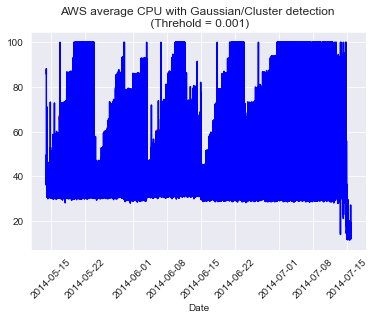

In [376]:
plotGauss(df4, title = "AWS average CPU")

### Isolation Forest

In [377]:
data = df4[['value', 'hours', 'Day', 'WeekDay']]

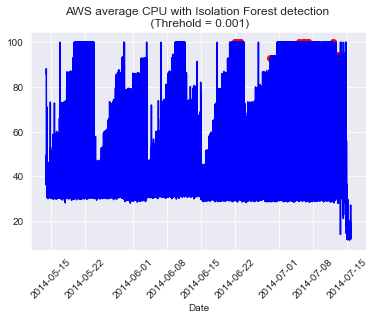

In [378]:
df4 = isolationForest(df4, data)
plotIsolationForest(df4, title = "AWS average CPU")

### One Class SVM

In [379]:
data = df4[['value', 'hours', 'Day', 'WeekDay']]
df4 = SVM(df4, data)

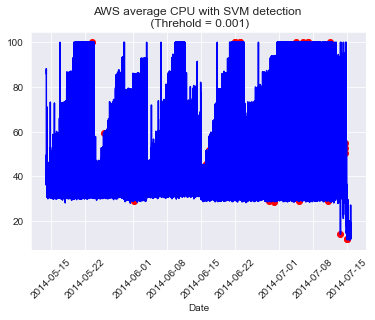

In [380]:
plotSVM(df4, title = "AWS average CPU")

### LSTM RNN

In [217]:
#select and standardize data
data_n = df4[['value', 'hours', 'Day', 'WeekDay']]
min_max_scaler = preprocessing.StandardScaler()
np_scaled = min_max_scaler.fit_transform(data_n)
data_n = pd.DataFrame(np_scaled)

# important parameters and train/test size
prediction_time = 1 
testdatasize = int(len(df4['value']) * .3)
unroll_length = 50
testdatacut = testdatasize + unroll_length  + 1

#train data
x_train = data_n[0:-prediction_time-testdatacut]
y_train = data_n[prediction_time:-testdatacut ][0]

# test data
x_test = data_n[0-testdatacut:-prediction_time]
y_test = data_n[prediction_time-testdatacut:  ][0]

In [218]:
def unroll(data,sequence_length=24):
    result = []
    for index in range(len(data) - sequence_length):
        result.append(data[index: index + sequence_length])
    return np.asarray(result)

# adapt the datasets for the sequence data shape
x_train = unroll(x_train,unroll_length)
x_test  = unroll(x_test,unroll_length)
y_train = y_train[-x_train.shape[0]:]
y_test  = y_test[-x_test.shape[0]:]

In [219]:
print('X Train shape: ', x_train.shape)
print('Y Train shape: ', y_train.shape)
print('X Test shape: ', x_test.shape)
print('Y Test shape: ', y_test.shape)

X Train shape:  (12533, 50, 4)
Y Train shape:  (12533,)
X Test shape:  (5415, 50, 4)
Y Test shape:  (5415,)


In [220]:
input_shape = (x_train.shape[1], x_train.shape[2])
input_shape

(50, 4)

In [221]:
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.layers import LSTM
from tensorflow.keras.models import Sequential
import time #helper libraries
from keras.models import model_from_json
import sys

model = Sequential()

model.add(LSTM(units = 100, return_sequences = True, input_shape = input_shape))
model.add(Dropout(0.2))
model.add(LSTM(units = 100, return_sequences = True))
model.add(Dropout(0.2))
model.add(LSTM(units = 100, return_sequences = False))
model.add(Dropout(0.2))
model.add(Dense(units = 1))
model.add(Activation('linear'))

start = time.time()
model.compile(loss='mse', optimizer='adam')
print('compilation time : {}'.format(time.time() - start))

compilation time : 0.0049877166748046875


In [222]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_12 (LSTM)               (None, 50, 100)           42000     
_________________________________________________________________
dropout_12 (Dropout)         (None, 50, 100)           0         
_________________________________________________________________
lstm_13 (LSTM)               (None, 50, 100)           80400     
_________________________________________________________________
dropout_13 (Dropout)         (None, 50, 100)           0         
_________________________________________________________________
lstm_14 (LSTM)               (None, 100)               80400     
_________________________________________________________________
dropout_14 (Dropout)         (None, 100)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                

In [223]:
model.fit(
    x_train,
    y_train,
    batch_size=64,
    epochs=15,
)

Epoch 1/15
196/196 [==============================] - 23s 94ms/step - loss: 0.6567
Epoch 2/15
196/196 [==============================] - 20s 103ms/step - loss: 0.1863
Epoch 3/15
196/196 [==============================] - 19s 99ms/step - loss: 0.1532
Epoch 4/15
196/196 [==============================] - 19s 99ms/step - loss: 0.1342
Epoch 5/15
196/196 [==============================] - 19s 99ms/step - loss: 0.1199
Epoch 6/15
196/196 [==============================] - 19s 99ms/step - loss: 0.1075
Epoch 7/15
196/196 [==============================] - 19s 99ms/step - loss: 0.1112
Epoch 8/15
196/196 [==============================] - 20s 101ms/step - loss: 0.1122
Epoch 9/15
196/196 [==============================] - 20s 102ms/step - loss: 0.0970
Epoch 10/15
196/196 [==============================] - 20s 104ms/step - loss: 0.1032
Epoch 11/15
196/196 [==============================] - 21s 105ms/step - loss: 0.0958
Epoch 12/15
196/196 [==============================] - 20s 102ms/step - loss: 0.

In [224]:
y_test = y_test.reset_index().drop(columns=['index'])

In [225]:
# create the list of difference between prediction and test data
diff=[]
ratio=[]
p = model.predict(x_test)
prediction = []

for u in range(len(y_test)):
    pr = p[u][0]
    prediction.append(pr)
    actual = y_test[0][u]
    ratio.append((actual / pr ) - 1)
    diff.append(abs(actual - pr))

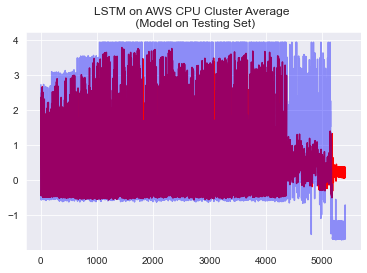

In [226]:
# plot the prediction and the reality (for the test data)
fig, axs = plt.subplots()
axs.plot(p,color='red', label='prediction')
axs.plot(y_test,color='blue', label='y_test', alpha=0.4)
axs.legend().set_visible(False)
plt.title('LSTM on AWS CPU Cluster Average \n (Model on Testing Set)')
plt.show()

In [229]:
# select the most distant prediction/reality data points as anomalies
diff = pd.Series(diff)
outliers_fraction = 0.01
number_of_outliers = int(outliers_fraction*len(diff))
threshold = diff.nlargest(number_of_outliers).min()
# data with anomaly label (test data part)
test = (diff >= threshold).astype(int)
# the training data part where we didn't predict anything (overfitting possible): no anomaly
complement = pd.Series(0, index=np.arange(len(data_n)-testdatasize))
# # add the data to the main
df4['anomaly27'] = complement.append(test, ignore_index='True')
print(df4['anomaly27'].value_counts())

0    17996
1       54
Name: anomaly27, dtype: int64


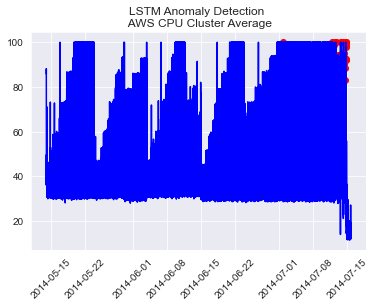

In [230]:
fig, ax = plt.subplots()

a = df4.loc[df4['anomaly27'] == 1, ['timestamp', 'value']] #anomaly

ax.plot(df4['timestamp'], df4['value'], color='blue')
ax.scatter(a['timestamp'],a['value'], color='red')
plt.title('LSTM Anomaly Detection \n AWS CPU Cluster Average')
plt.setp(ax.get_xticklabels(), rotation=45)
plt.show()

# Credit Fraud Dataset

In [62]:
dfcc = pd.read_csv('C:/Users/Damien/Desktop/Aquis/Resources/creditcardfraud_normalised.csv')

In [63]:
dfcc.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,class
0,0.935192,0.766490,0.881365,0.313023,0.763439,0.267669,0.266815,0.786444,0.475312,0.510600,...,0.561184,0.522992,0.663793,0.391253,0.585122,0.394557,0.418976,0.312697,0.005824,0
1,0.978542,0.770067,0.840298,0.271796,0.766120,0.262192,0.264875,0.786298,0.453981,0.505267,...,0.557840,0.480237,0.666938,0.336440,0.587290,0.446013,0.416345,0.313423,0.000105,0
2,0.935217,0.753118,0.868141,0.268766,0.762329,0.281122,0.270177,0.788042,0.410603,0.513018,...,0.565477,0.546030,0.678939,0.289354,0.559515,0.402727,0.415489,0.311911,0.014739,0
3,0.941878,0.765304,0.868484,0.213661,0.765647,0.275559,0.266803,0.789434,0.414999,0.507585,...,0.559734,0.510277,0.662607,0.223826,0.614245,0.389197,0.417669,0.314371,0.004807,0
4,0.938617,0.776520,0.864251,0.269796,0.762975,0.263984,0.268968,0.782484,0.490950,0.524303,...,0.561327,0.547271,0.663392,0.401270,0.566343,0.507497,0.420561,0.317490,0.002724,0


Text(0.5, 1.0, 'Credit Card Fraud Dataset')

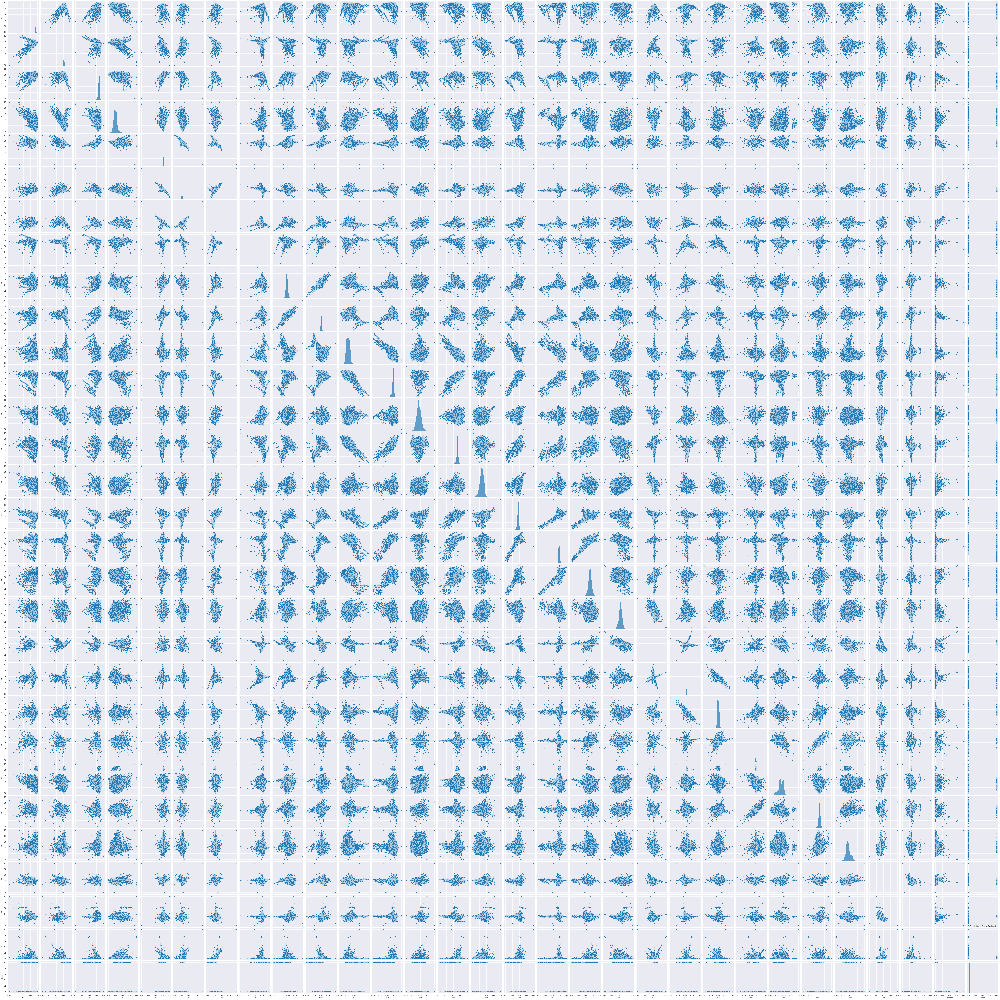

In [64]:
sns.pairplot(dfcc)
plt.title('Credit Card Fraud Dataset')

In [26]:
X = dfcc.drop('class', axis=1)
Y = dfcc['class']

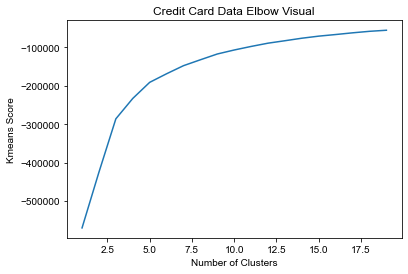

In [27]:
data = X
data = PCA_2(data)
kmeans, scores = KmeansCluster(data)
plot_elbow(scores, title = "Credit Card Data")

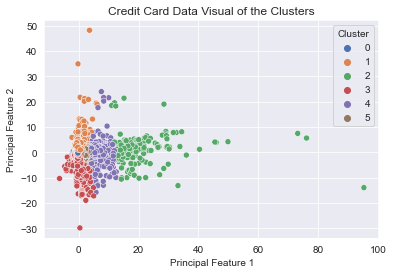

In [51]:
cluster = 5
dfcc = assign_clusters(dfcc, data, kmeans, cluster)
plotClusters(dfcc, title = "Credit Card Data")

In [52]:
dfcc = assignKmeansAnamoly(dfcc, data, kmeans, cluster)

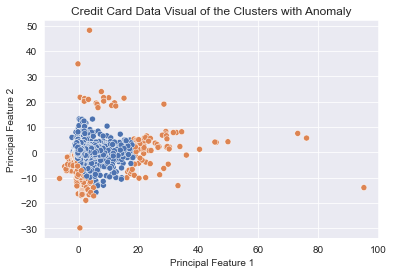

In [53]:
PlotClusterAnomaly(dfcc, title = "Credit Card Data")

In [49]:
dfcc['Anomaly_Kmeans'].unique()

array([0, 1])

In [54]:
Kmeans_TP = dfcc[(dfcc['class'] == 1) & (dfcc['Anomaly_Kmeans'] == 1)].shape[0]
Kmeans_TN = dfcc[(dfcc['class'] == 0) & (dfcc['Anomaly_Kmeans'] == 0)].shape[0]
Kmeans_FP = dfcc[(dfcc['class'] == 0) & (dfcc['Anomaly_Kmeans'] == 1)].shape[0]
Kmeans_FN = dfcc[(dfcc['class'] == 1) & (dfcc['Anomaly_Kmeans'] == 0)].shape[0]
print('K-means (5 Clusters) True Positive: ', Kmeans_TP)
print('K-means (5 Clusters) True Negative: ', Kmeans_TN)
print('K-means (5 Clusters) False Positive: ', Kmeans_FP)
print('K-means (5 Clusters) False Negative: ', Kmeans_FN)

K-means (5 Clusters) True Positive:  88
K-means (5 Clusters) True Negative:  281555
K-means (5 Clusters) False Positive:  2760
K-means (5 Clusters) False Negative:  404


[Text(0, 0.5, 'Fraud'), Text(0, 1.5, 'No Fraud')]

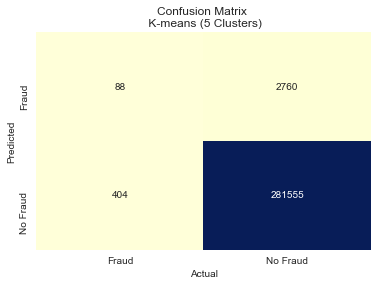

In [55]:
kmeans_confusion = [[Kmeans_TP,Kmeans_FP], [Kmeans_FN ,Kmeans_TN]]
ax = sns.heatmap(kmeans_confusion, annot=True, fmt='d', cmap="YlGnBu", cbar=False)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title("Confusion Matrix \n K-means (5 Clusters)")
ax.set_xticklabels(['Fraud', 'No Fraud'])
ax.set_yticklabels(['Fraud', 'No Fraud'])

In [56]:
data = X
dfcc = isolationForest(dfcc, data)

In [57]:
IF_TP = dfcc[(dfcc['class'] == 1) & (dfcc['Anomaly_IF'] == 1)].shape[0]
IF_TN = dfcc[(dfcc['class'] == 0) & (dfcc['Anomaly_IF'] == 0)].shape[0]
IF_FP = dfcc[(dfcc['class'] == 0) & (dfcc['Anomaly_IF'] == 1)].shape[0]
IF_FN = dfcc[(dfcc['class'] == 1) & (dfcc['Anomaly_IF'] == 0)].shape[0]
print('Isolation Forest True Positive: ', IF_TP)
print('Isolation Forest True Negative: ', IF_TN)
print('Isolation Forest False Positive: ', IF_FP)
print('Isolation Forest False Negative: ', IF_FN)

Isolation Forest True Positive:  270
Isolation Forest True Negative:  281736
Isolation Forest False Positive:  2579
Isolation Forest False Negative:  222


[Text(0, 0.5, 'Fraud'), Text(0, 1.5, 'No Fraud')]

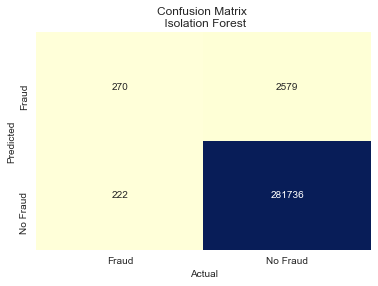

In [58]:
IF_confusion = [[IF_TP,IF_FP], [IF_FN ,IF_TN]]
ax = sns.heatmap(IF_confusion, annot=True, fmt='d', cmap="YlGnBu", cbar=False)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title("Confusion Matrix \n Isolation Forest")
ax.set_xticklabels(['Fraud', 'No Fraud'])
ax.set_yticklabels(['Fraud', 'No Fraud'])

In [59]:
data = X
dfcc = SVM(dfcc, data)

In [60]:
SVM_TP = dfcc[(dfcc['class'] == 1) & (dfcc['Anomaly_SVM'] == 1)].shape[0]
SVM_TN = dfcc[(dfcc['class'] == 0) & (dfcc['Anomaly_SVM'] == 0)].shape[0]
SVM_FP = dfcc[(dfcc['class'] == 0) & (dfcc['Anomaly_SVM'] == 1)].shape[0]
SVM_FN = dfcc[(dfcc['class'] == 1) & (dfcc['Anomaly_SVM'] == 0)].shape[0]
print('SVM True Positive: ', SVM_TP)
print('SVM True Negative: ', SVM_TN)
print('SVM False Positive: ', SVM_FP)
print('SVM False Negative: ', SVM_FN)

SVM True Positive:  237
SVM True Negative:  281744
SVM False Positive:  2571
SVM False Negative:  255


[Text(0, 0.5, 'Fraud'), Text(0, 1.5, 'No Fraud')]

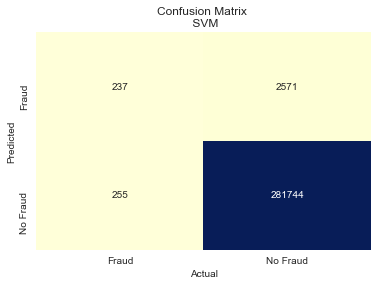

In [61]:
SVM_confusion = [[SVM_TP,SVM_FP], [SVM_FN ,SVM_TN]]
ax = sns.heatmap(SVM_confusion, annot=True, fmt='d', cmap="YlGnBu", cbar=False)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title("Confusion Matrix \n SVM")
ax.set_xticklabels(['Fraud', 'No Fraud'])
ax.set_yticklabels(['Fraud', 'No Fraud'])

In [26]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [44]:
X_train = X_train.values
X_test = X_test.values
y_train = y_train.values
y_test = y_test.values

In [45]:
models = {
    "LogisiticRegression": LogisticRegression(),
    "KNearest": KNeighborsClassifier(),
    "Support Vector Classifier": SVC(),
    "DecisionTreeClassifier": DecisionTreeClassifier()
}

In [46]:
from sklearn.model_selection import cross_val_score
for key, classifier in models.items():
    classifier.fit(X_train, y_train)
    training_score = cross_val_score(classifier, X_train, y_train, cv=5)
    print(classifier.__class__.__name__, " model has a training score of", round(training_score.mean(), 2) * 100, "% accuracy score")

Classifiers:  LogisticRegression Has a training score of 100.0 % accuracy score
Classifiers:  KNeighborsClassifier Has a training score of 100.0 % accuracy score
Classifiers:  SVC Has a training score of 100.0 % accuracy score
Classifiers:  DecisionTreeClassifier Has a training score of 100.0 % accuracy score


In [57]:
from sklearn.model_selection import GridSearchCV


# Logistic Regression 
log_reg_params = {"penalty": ['l1', 'l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]}



grid_log_reg = GridSearchCV(LogisticRegression(), log_reg_params)
grid_log_reg.fit(X_train, y_train)
# We automatically get the logistic regression with the best parameters.
log_reg = grid_log_reg.best_estimator_

knears_params = {"n_neighbors": list(range(2,5,1)), 'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']}

grid_knears = GridSearchCV(KNeighborsClassifier(), knears_params)
grid_knears.fit(X_train, y_train)
# KNears best estimator
knears_neighbors = grid_knears.best_estimator_

# Support Vector Classifier
svc_params = {'C': [0.5, 0.7, 0.9, 1], 'kernel': ['rbf', 'poly', 'sigmoid', 'linear']}
grid_svc = GridSearchCV(SVC(), svc_params)
grid_svc.fit(X_train, y_train)

# SVC best estimator
svc = grid_svc.best_estimator_

# DecisionTree Classifier
tree_params = {"criterion": ["gini", "entropy"], "max_depth": list(range(2,4,1)), 
              "min_samples_leaf": list(range(5,7,1))}
grid_tree = GridSearchCV(DecisionTreeClassifier(), tree_params)
grid_tree.fit(X_train, y_train)

# tree best estimator
tree_clf = grid_tree.best_estimator_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1304, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 442, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The scor

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\ProgramData\Anaconda3\lib\site-packages

In [58]:
log_reg_score = cross_val_score(log_reg, X_train, y_train, cv=10)
print('Logistic Regression Cross Validation Score: ', round(log_reg_score.mean() * 100, 2).astype(str) + '%')

knears_score = cross_val_score(knears_neighbors, X_train, y_train, cv=10)
print('Knears Neighbors Cross Validation Score', round(knears_score.mean() * 100, 2).astype(str) + '%')

svc_score = cross_val_score(svc, X_train, y_train, cv=10)
print('Support Vector Classifier Cross Validation Score', round(svc_score.mean() * 100, 2).astype(str) + '%')

tree_score = cross_val_score(tree_clf, X_train, y_train, cv=10)
print('DecisionTree Classifier Cross Validation Score', round(tree_score.mean() * 100, 2).astype(str) + '%')

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\ProgramData\Anaconda3\lib\site-packages

Logistic Regression Cross Validation Score:  99.92%
Knears Neighbors Cross Validation Score 99.95%
Support Vector Classifier Cross Validation Score 99.94%
DecisionTree Classifier Cross Validation Score 99.94%


In [59]:
from sklearn.model_selection import cross_val_predict
log_reg_pred = cross_val_predict(log_reg, X_train, y_train, cv=10,
                             method="decision_function")
knears_pred = cross_val_predict(knears_neighbors, X_train, y_train, cv=10)

svc_pred = cross_val_predict(svc, X_train, y_train, cv=10,
                             method="decision_function")

tree_pred = cross_val_predict(tree_clf, X_train, y_train, cv=10)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\ProgramData\Anaconda3\lib\site-packages

In [60]:
from sklearn.metrics import roc_auc_score

print('Logistic Regression: ', roc_auc_score(y_train, log_reg_pred))
print('KNears Neighbors: ', roc_auc_score(y_train, knears_pred))
print('Support Vector Classifier: ', roc_auc_score(y_train, svc_pred))
print('Decision Tree Classifier: ', roc_auc_score(y_train, tree_pred))

Logistic Regression:  0.9766544574212637
KNears Neighbors:  0.8793822709223231
Support Vector Classifier:  0.9575169389415207
Decision Tree Classifier:  0.902143574316347


In [61]:
from sklearn.metrics import roc_curve
log_fpr, log_tpr, log_thresold = roc_curve(y_train, log_reg_pred)
knear_fpr, knear_tpr, knear_threshold = roc_curve(y_train, knears_pred)
svc_fpr, svc_tpr, svc_threshold = roc_curve(y_train, svc_pred)
tree_fpr, tree_tpr, tree_threshold = roc_curve(y_train, tree_pred)

In [63]:
df_log = pd.DataFrame({'FPR':log_fpr, 'TPR': log_tpr})
df_log['model'] = 'Logistic'

df_knear = pd.DataFrame({'FPR':knear_fpr, 'TPR': knear_tpr})
df_knear['model'] = 'KNN'

df_svc = pd.DataFrame({'FPR':svc_fpr, 'TPR': svc_tpr})
df_svc['model'] = 'SVC'

df_tree = pd.DataFrame({'FPR':tree_fpr, 'TPR': tree_tpr})
df_tree['model'] = 'Decision Tree'

df_scores = df_log.append([df_knear, df_svc, df_tree])

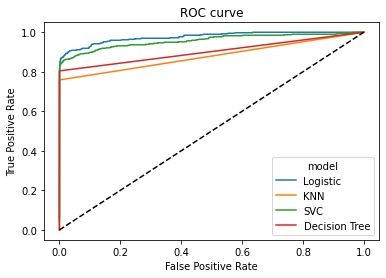

In [68]:
sns.lineplot(x='FPR', y='TPR', data=df_scores, hue='model')
plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.plot([0, 1], [0, 1], 'k--')

In [72]:
from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score
def model_scores(model, title):
    y_pred = model.predict(X_train)
    print(title)
    print('Overfitting: \n')
    print('Recall Score: {:.2f}'.format(recall_score(y_train, y_pred)))
    print('Precision Score: {:.2f}'.format(precision_score(y_train, y_pred)))
    print('F1 Score: {:.2f}'.format(f1_score(y_train, y_pred)))
    print('Accuracy Score: {:.2f}'.format(accuracy_score(y_train, y_pred)))

In [74]:
model_scores(log_reg, 'Logistic Regression')

Logistic Regression
Overfitting: 

Recall Score: 0.62
Precision Score: 0.89
F1 Score: 0.73
Accuracy Score: 1.00


In [75]:
model_scores(knears_neighbors, 'KNN')

KNN
Overfitting: 

Recall Score: 0.80
Precision Score: 0.97
F1 Score: 0.88
Accuracy Score: 1.00


In [76]:
model_scores(svc, 'SVC')

SVC
Overfitting: 

Recall Score: 0.80
Precision Score: 0.88
F1 Score: 0.84
Accuracy Score: 1.00


In [77]:
model_scores(tree_clf, 'Decision Tree')

Decision Tree
Overfitting: 

Recall Score: 0.80
Precision Score: 0.85
F1 Score: 0.83
Accuracy Score: 1.00


In [81]:
def model_scores_test(model, title):
    y_pred = model.predict(X_test)
    print(title)
    print('Overfitting: \n')
    print('Recall Score: {:.2f}'.format(recall_score(y_test, y_pred)))
    print('Precision Score: {:.2f}'.format(precision_score(y_test, y_pred)))
    print('F1 Score: {:.2f}'.format(f1_score(y_test, y_pred)))
    print('Accuracy Score: {:.2f}'.format(accuracy_score(y_test, y_pred)))

In [82]:
model_scores_test(log_reg, 'Logistic Regression')

Logistic Regression
Overfitting: 

Recall Score: 0.59
Precision Score: 0.87
F1 Score: 0.70
Accuracy Score: 1.00


In [83]:
model_scores_test(knears_neighbors, 'KNN')

KNN
Overfitting: 

Recall Score: 0.74
Precision Score: 0.95
F1 Score: 0.83
Accuracy Score: 1.00


In [84]:
model_scores_test(svc, 'SVC')

SVC
Overfitting: 

Recall Score: 0.80
Precision Score: 0.84
F1 Score: 0.82
Accuracy Score: 1.00


In [85]:
model_scores_test(tree_clf, 'Decision Tree')

Decision Tree
Overfitting: 

Recall Score: 0.79
Precision Score: 0.87
F1 Score: 0.82
Accuracy Score: 1.00


In [34]:
dfcc.reset_index(inplace=True)

In [35]:
dfcc.head()

,index,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,class
0,0,0.935192,0.766490,0.881365,0.313023,0.763439,0.267669,0.266815,0.786444,0.475312,...,0.561184,0.522992,0.663793,0.391253,0.585122,0.394557,0.418976,0.312697,0.005824,0
1,1,0.978542,0.770067,0.840298,0.271796,0.766120,0.262192,0.264875,0.786298,0.453981,...,0.557840,0.480237,0.666938,0.336440,0.587290,0.446013,0.416345,0.313423,0.000105,0
2,2,0.935217,0.753118,0.868141,0.268766,0.762329,0.281122,0.270177,0.788042,0.410603,...,0.565477,0.546030,0.678939,0.289354,0.559515,0.402727,0.415489,0.311911,0.014739,0
3,3,0.941878,0.765304,0.868484,0.213661,0.765647,0.275559,0.266803,0.789434,0.414999,...,0.559734,0.510277,0.662607,0.223826,0.614245,0.389197,0.417669,0.314371,0.004807,0
4,4,0.938617,0.776520,0.864251,0.269796,0.762975,0.263984,0.268968,0.782484,0.490950,...,0.561327,0.547271,0.663392,0.401270,0.566343,0.507497,0.420561,0.317490,0.002724,0


([], [])

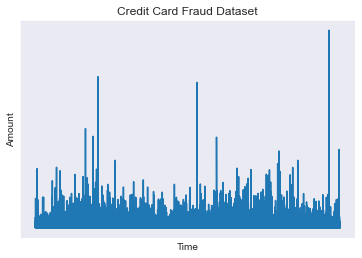

In [41]:
import seaborn as sns
sns.lineplot(data=dfcc, x='index', y='Amount')
plt.title('Credit Card Fraud Dataset')
plt.xlabel('Time')
plt.ylabel('Amount')
plt.xticks([])
plt.yticks([])